<a href="https://colab.research.google.com/github/Siew-116/grass-seg-unet/blob/main/model1_v3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Grass Semgentation (U-Net + MobileNetv2 encoder)
Model 1

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
import zipfile

In [6]:
img_zip_path = "/content/drive/MyDrive/split_3.zip"

with zipfile.ZipFile(img_zip_path, 'r') as zip_ref:
    zip_ref.extractall('/content/dataset')

In [7]:
# Import library
import tensorflow as tf
import keras
import os
import json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from datetime import datetime
from tensorflow import data  as tf_data
from tensorflow import image as tf_image
from tensorflow import io    as tf_io
from keras import layers, Model
import keras.backend as K
import random

In [8]:
# Configuration
BASE_DIR        = "/content/dataset/split_3"
TRAIN_IMAGE_DIR = os.path.join(BASE_DIR, "train", "images")
TRAIN_MASK_DIR  = os.path.join(BASE_DIR, "train", "masks")
VAL_IMAGE_DIR   = os.path.join(BASE_DIR, "val",   "images")
VAL_MASK_DIR    = os.path.join(BASE_DIR, "val",   "masks")
TEST_IMAGE_DIR  = os.path.join(BASE_DIR, "test",  "images")
TEST_MASK_DIR   = os.path.join(BASE_DIR, "test",  "masks")

MODEL_DIR       = "/content/unet/models"
LOG_DIR         = "/content/unet/logs"
RESULT_DIR      = "/content/unet/results"

os.makedirs(MODEL_DIR,  exist_ok=True)
os.makedirs(LOG_DIR,    exist_ok=True)
os.makedirs(RESULT_DIR, exist_ok=True)


IMG_SIZE    = (256, 256)
NUM_CLASSES = 4
BATCH_SIZE  = 32
EPOCHS      = 20
SEED        = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

LR_P1 = 1e-4
LR_P2 = 1e-5

CLASS_NAMES = {
    0: "background",
    1: "grass_short",
    2: "grass_medium",
    3: "grass_long"
}

print(f"  Image size   : {IMG_SIZE}")
print(f"  Num classes  : {NUM_CLASSES}")
print(f"  Batch size   : {BATCH_SIZE}")
print(f"  Epochs       : {EPOCHS}")

  Image size   : (256, 256)
  Num classes  : 4
  Batch size   : 32
  Epochs       : 20


# Processing dataset

In [9]:
# Verify and match data
print("Verifying data...")
for name, img_dir, mask_dir in [
    ("Train", TRAIN_IMAGE_DIR, TRAIN_MASK_DIR),
    ("Val",   VAL_IMAGE_DIR,   VAL_MASK_DIR),
    ("Test",  TEST_IMAGE_DIR,  TEST_MASK_DIR),
]:
    n_img  = len(os.listdir(img_dir))
    n_mask = len(os.listdir(mask_dir))
    match  = "OK" if n_img == n_mask else "MISMATCH"
    print(f"  {name:<6} images: {n_img:>5}  masks: {n_mask:>5}  [{match}]")

Verifying data...
  Train  images:  4796  masks:  4796  [OK]
  Val    images:   600  masks:   600  [OK]
  Test   images:   600  masks:   600  [OK]


In [10]:
# Pair the original image and its mask
def get_path_pairs(image_dir, mask_dir):
    image_files = sorted(os.listdir(image_dir))
    img_paths   = []
    mask_paths  = []
    missing     = []

    for img_file in image_files:
        stem      = os.path.splitext(img_file)[0]
        mask_file = stem + ".png"
        img_path  = os.path.join(image_dir, img_file)
        mask_path = os.path.join(mask_dir,  mask_file)

        if os.path.exists(mask_path):
            img_paths.append(img_path)
            mask_paths.append(mask_path)
        else:
            missing.append(img_file)

    print(f"  Pairs: {len(img_paths)}  Missing: {len(missing)}")
    return img_paths, mask_paths

print("Building path pairs...")
train_img_paths,  train_mask_paths  = get_path_pairs(TRAIN_IMAGE_DIR, TRAIN_MASK_DIR)
val_img_paths,    val_mask_paths    = get_path_pairs(VAL_IMAGE_DIR,   VAL_MASK_DIR)
test_img_paths,   test_mask_paths   = get_path_pairs(TEST_IMAGE_DIR,  TEST_MASK_DIR)

print(f"\nTrain : {len(train_img_paths)}")
print(f"Val   : {len(val_img_paths)}")
print(f"Test  : {len(test_img_paths)}")

Building path pairs...
  Pairs: 4796  Missing: 0
  Pairs: 600  Missing: 0
  Pairs: 600  Missing: 0

Train : 4796
Val   : 600
Test  : 600


In [11]:
import cv2

print("Computing class weights from training masks...")
counts = np.zeros(NUM_CLASSES, dtype=np.int64)

for mask_path in train_mask_paths:
    m = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if m is None:
        continue
    for c in range(NUM_CLASSES):
        counts[c] += np.sum(m == c)

total         = counts.sum()
freqs         = (counts / total).astype(np.float32)
weights       = 1.0 / np.sqrt(freqs)
weights       = weights / weights.mean()
weights       = np.clip(weights, 0.2, 4.0)

class_weights = {i: float(weights[i]) for i in range(4)}
CW            = tf.constant(weights, dtype=tf.float32)

print(f"  Frequencies   : {np.round(freqs,   4)}")
print(f"  Class weights : {np.round(weights, 4)}")

Computing class weights from training masks...
  Frequencies   : [0.9315 0.0377 0.0177 0.0131]
  Class weights : [0.2    0.9182 1.3416 1.5554]


In [12]:
# Load data
def load_img_mask(img_path, mask_path):
    # Load image
    img = tf_io.read_file(img_path)
    img = tf_io.decode_jpeg(img, channels=3)
    img = tf_image.resize(img, IMG_SIZE)
    img = tf.cast(img, tf.float32) / 255.0

    # Load mask
    mask = tf_io.read_file(mask_path)
    mask = tf_io.decode_png(mask, channels=1)
    mask = tf_image.resize(mask, IMG_SIZE, method="nearest")
    mask = tf.cast(mask, tf.uint8)

    return img, mask

In [13]:
# Augmentation
def augment_fn(img, mask):
    # Horizontal flip
    flip = tf.random.uniform([]) > 0.5
    img  = tf.cond(flip, lambda: tf_image.flip_left_right(img),  lambda: img)
    mask = tf.cond(flip, lambda: tf_image.flip_left_right(mask), lambda: mask)

    # Vertical flip
    flip = tf.random.uniform([]) > 0.5
    img  = tf.cond(flip, lambda: tf_image.flip_up_down(img),  lambda: img)
    mask = tf.cond(flip, lambda: tf_image.flip_up_down(mask), lambda: mask)


    # Random brightness — image only, never mask
    img = tf_image.random_brightness(img, max_delta=0.1)
    img = tf.clip_by_value(img, 0.0, 1.0)

    # Random contrast
    img = tf_image.random_contrast(img, lower=0.9, upper=1.1)
    img = tf.clip_by_value(img, 0.0, 1.0)

    # Random saturation
    img = tf_image.random_saturation(img, lower=0.8, upper=1.2)
    img = tf.clip_by_value(img, 0.0, 1.0)

    # Random HUE
    img = tf_image.random_hue(img, max_delta=0.05)
    img = tf.clip_by_value(img, 0.0, 1.0)

    return img, mask

In [14]:
# Load dataset
def get_dataset(img_paths, mask_paths, batch_size, augment=False, shuffle=True):
    dataset = tf_data.Dataset.from_tensor_slices((img_paths, mask_paths))
    dataset = dataset.map(load_img_mask, num_parallel_calls=tf_data.AUTOTUNE)

    if augment:
        dataset = dataset.map(augment_fn, num_parallel_calls=tf_data.AUTOTUNE)

    if shuffle:
        dataset = dataset.shuffle(buffer_size=1000, seed=SEED)
        dataset = dataset.repeat() # only apply .repeat() to train data

    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf_data.AUTOTUNE)
    return dataset


train_dataset = get_dataset(train_img_paths, train_mask_paths, BATCH_SIZE, augment=True,  shuffle=True)
val_dataset   = get_dataset(val_img_paths,   val_mask_paths,   BATCH_SIZE, augment=False, shuffle=False)
test_dataset  = get_dataset(test_img_paths,  test_mask_paths,  BATCH_SIZE, augment=False, shuffle=False)

#print(f"Train batches : {len(train_dataset)}") # infinite
print(f"Val batches   : {len(val_dataset)}")
print(f"Test batches  : {len(test_dataset)}")

Val batches   : 19
Test batches  : 19


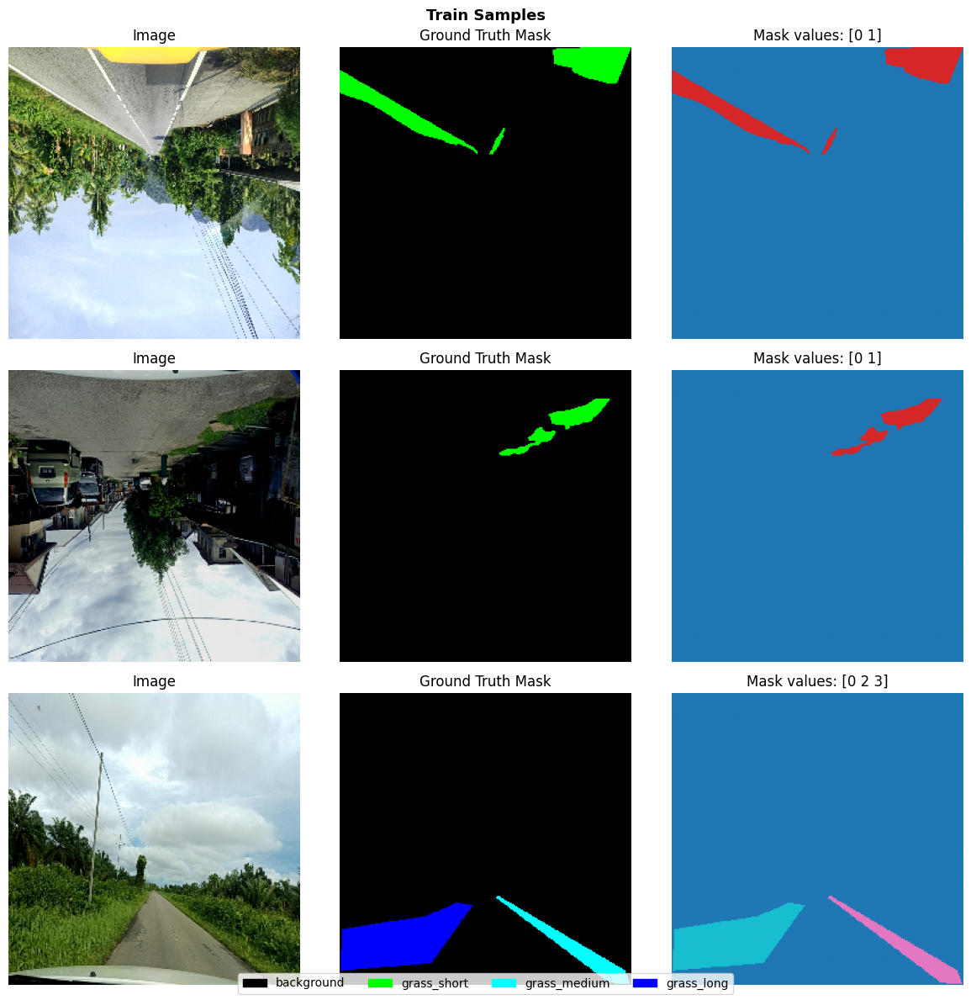

In [15]:
# Visualize samples
CLASS_COLORS = {
    0: [0,   0,   0],    # background  black
    1: [0,   255, 0],    # grass_short green
    2: [0,   255, 255],  # grass_medium yellow
    3: [0,   0,   255],  # grass_long  red
}

def mask_to_rgb(mask):
    mask  = np.squeeze(mask.numpy())
    rgb   = np.zeros((*mask.shape, 3), dtype=np.uint8)
    for class_id, color in CLASS_COLORS.items():
        rgb[mask == class_id] = color
    return rgb

def show_samples(dataset, n=3, title="Samples"):
    fig, axes = plt.subplots(n, 3, figsize=(12, n * 4))
    fig.suptitle(title, fontsize=13, fontweight="bold")

    for images, masks in dataset.take(1):
        for i in range(min(n, len(images))):
            axes[i][0].imshow(images[i].numpy())
            axes[i][0].set_title("Image")
            axes[i][0].axis("off")

            axes[i][1].imshow(mask_to_rgb(masks[i]))
            axes[i][1].set_title("Ground Truth Mask")
            axes[i][1].axis("off")

            # Show mask raw values
            unique = np.unique(masks[i].numpy())
            axes[i][2].imshow(masks[i].numpy().squeeze(), cmap="tab10", vmin=0, vmax=3)
            axes[i][2].set_title(f"Mask values: {unique}")
            axes[i][2].axis("off")

    # Legend
    patches = [mpatches.Patch(color=np.array(c)/255, label=CLASS_NAMES[k])
               for k, c in CLASS_COLORS.items()]
    fig.legend(handles=patches, loc="lower center", ncol=4)
    plt.tight_layout()
    plt.savefig(os.path.join(RESULT_DIR, "sample_images.png"), dpi=150)
    plt.show()

show_samples(train_dataset, n=3, title="Train Samples")

# Build model

In [16]:
# BUILD MODEL
def build_unet_mobilenetv2(img_size, num_classes):

    # ---- ENCODER: MobileNetV2 pretrained on ImageNet ----
    base_model = tf.keras.applications.MobileNetV2(
        input_shape = img_size + (3,),
        include_top = False,
        weights     = "imagenet"    # pretrained weights
    )

    # Freeze encoder
    base_model.trainable = False

    # Skip connection layers from MobileNetV2
    skip_layer_names = [
        "block_1_expand_relu",    # 64x64
        "block_3_expand_relu",    # 32x32
        "block_6_expand_relu",    # 16x16
        "block_13_expand_relu",   # 8x8
        "block_16_project",       # 4x4  (bottleneck)
    ]

    # Extract skip connection outputs
    skip_outputs = [base_model.get_layer(name).output for name in skip_layer_names]
    encoder      = Model(inputs=base_model.input, outputs=skip_outputs, name="mobilenetv2_encoder")

    # ---- DECODER: Upsampling with skip connections ----
    inputs  = layers.Input(shape=img_size + (3,), name="input_image")
    skips   = encoder(inputs)
    x       = skips[-1]           # start from bottleneck
    skips_reversed = list(reversed(skips[:-1]))

    # Match decoder size to encoder
    decoder_filters = [512, 256, 128, 64, 32, 16]

    for filters, skip in zip(decoder_filters, skips_reversed):
        # Upsample
        x = layers.Conv2DTranspose(filters, 3, strides=2, padding="same")(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)

        # Skip connection
        x = layers.Concatenate()([x, skip])

        # Refine
        x = layers.Conv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)
        x = layers.Dropout(0.1)(x)

        x = layers.Conv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)
        x = layers.Dropout(0.1)(x)

    # Final upsample to original size
    x = layers.Conv2DTranspose(32, 3, strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    # Output layer — softmax over num_classes
    outputs = layers.Conv2D(num_classes, 1, activation="softmax", name="output")(x)

    model = Model(inputs=inputs, outputs=outputs, name="unet_mobilenetv2")
    return model, base_model


model, base_model = build_unet_mobilenetv2(IMG_SIZE, NUM_CLASSES)
model.summary()

/tmp/ipykernel_2985/2523730031.py:5: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = tf.keras.applications.MobileNetV2(


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "unet_mobilenetv2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mobilenetv2_encoder │ [(None, 128, 128, │  1,841,984 │ input_image[0][0] │
│ (Functional)        │ 96), (None, 64,   │            │                   │
│                     │ 64, 144), (None,  │            │                   │
│                     │ 32, 32, 192),     │            │                   │
│                     │ (None, 16, 16,    │            │                   │
│                     │ 576), (None, 8,   │            │                   │
│                     │ 8, 320)]          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose    │ (None, 16, 16,    │  1,475,072 │ mobilenetv2_enco… │
│ (Conv2DTranspose)   │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 16, 16,    │      2,048 │ conv2d_transpose… │
│ (BatchNormalizatio… │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 16, 16,    │          0 │ batch_normalizat… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 16, 16,    │          0 │ re_lu[0][0],      │
│ (Concatenate)       │ 1088)             │            │ mobilenetv2_enco… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 16, 16,    │  5,014,016 │ concatenate[0][0] │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │      2,048 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 16, 16,    │          0 │ batch_normalizat… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 16, 16,    │          0 │ re_lu_1[0][0]     │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 16, 16,    │  2,359,808 │ dropout[0][0]     │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │      2,048 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 16, 16,    │          0 │ batch_normalizat… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 16, 16,    │          0 │ re_lu_2[0][0]     │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_1  │ (None, 32, 32,    │  1,179,904 │ dropout_1[0][0]   │
│ (Conv2DTranspose)   │ 256)              │            │                 

 Total params: 14,482,596 (55.25 MB)

 Trainable params: 12,634,788 (48.20 MB)

 Non-trainable params: 1,847,808 (7.05 MB)

# Metrics - IoU

In [17]:
class MeanIoUExcludeBackground(tf.keras.metrics.Metric):
    def __init__(self, num_classes=4, name="mean_iou_no_bg", **kwargs):
        super().__init__(name=name, **kwargs)
        self.num_classes = num_classes
        self.iou = tf.keras.metrics.MeanIoU(num_classes=num_classes)

    def update_state(self, y_true, y_pred, sample_weight=None):
        if y_true.shape[-1] == self.num_classes:
            yt = tf.argmax(y_true, axis=-1)
        else:
            yt = tf.cast(tf.squeeze(y_true, axis=-1), tf.int32)
        yp = tf.argmax(y_pred, axis=-1)
        self.iou.update_state(yt, yp, sample_weight=sample_weight)

    def result(self):
        cm   = tf.cast(self.iou.total_cm, tf.float32)
        ious = []
        for c in range(1, self.num_classes):
            tp    = cm[c, c]
            fp    = tf.reduce_sum(cm[:, c]) - tp
            fn    = tf.reduce_sum(cm[c, :]) - tp
            denom = tp + fp + fn
            iou_c = tf.where(denom > 0, tp / denom, 0.0)
            ious.append(iou_c)
        return tf.reduce_mean(tf.stack(ious))

    def reset_states(self):
        self.iou.reset_states()

    def get_config(self):
        config = super().get_config()
        config.update({"num_classes": self.num_classes})
        return config

    @classmethod
    def from_config(cls, config):
        # force num_classes=4 if missing from old saved config
        config.setdefault("num_classes", 4)
        return cls(**config)

# Loss Function

In [18]:
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy()

def total_loss(y_true, y_pred):
    y_true_flat = tf.cast(tf.reshape(y_true, [-1]), tf.int32)
    weights_map = tf.gather(
        tf.constant([class_weights[i] for i in range(4)], dtype=tf.float32),
        y_true_flat
    )
    loss = tf.keras.losses.sparse_categorical_crossentropy(
        tf.reshape(y_true, [-1]),   # flat 1D
        tf.reshape(y_pred, [-1, NUM_CLASSES])
    )
    return tf.reduce_mean(loss * weights_map)

# Train model

In [19]:
# ---- Phase 1: Initial training ----
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=LR_P1),
    loss=total_loss,
    metrics=[
        "accuracy",
        MeanIoUExcludeBackground(NUM_CLASSES, name="mean_iou_no_bg")
    ]
)

STEPS_PER_EPOCH  = len(train_img_paths) // BATCH_SIZE
VALIDATION_STEPS = len(val_img_paths)   // BATCH_SIZE

checkpoint_path = os.path.join(MODEL_DIR, "unet_1.keras")

callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath       = checkpoint_path,
        monitor        = "val_mean_iou_no_bg",
        mode           = "max",
        save_best_only = True,
        verbose        = 1
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor              = "val_mean_iou_no_bg",
        mode                 = "max",
        patience             = 12,
        verbose              = 1,
        restore_best_weights = True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_mean_iou_no_bg",
        mode="max",
        factor=0.5,
        patience=5,
        min_lr=1e-6,
        verbose=1
    ),
    tf.keras.callbacks.TensorBoard(
        log_dir = LOG_DIR
    )

]

# Run training
history = model.fit(
    train_dataset,
    epochs           = EPOCHS,
    steps_per_epoch  = STEPS_PER_EPOCH,
    validation_data  = val_dataset,
    validation_steps = VALIDATION_STEPS,
    callbacks        = callbacks
)

Epoch 1/20
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 618ms/step - accuracy: 0.7571 - loss: 0.2713 - mean_iou_no_bg: 0.0732
Epoch 1: val_mean_iou_no_bg improved from -inf to 0.17837, saving model to /content/unet/models/unet_1.keras
149/149 ━━━━━━━━━━━━━━━━━━━━ 207s 753ms/step - accuracy: 0.7577 - loss: 0.2709 - mean_iou_no_bg: 0.0735 - val_accuracy: 0.9388 - val_loss: 0.2203 - val_mean_iou_no_bg: 0.1784 - learning_rate: 1.0000e-04
Epoch 2/20
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 570ms/step - accuracy: 0.9289 - loss: 0.1470 - mean_iou_no_bg: 0.2294
Epoch 2: val_mean_iou_no_bg improved from 0.17837 to 0.25361, saving model to /content/unet/models/unet_1.keras
149/149 ━━━━━━━━━━━━━━━━━━━━ 96s 643ms/step - accuracy: 0.9289 - loss: 0.1469 - mean_iou_no_bg: 0.2294 - val_accuracy: 0.9210 - val_loss: 0.1388 - val_mean_iou_no_bg: 0.2536 - learning_rate: 1.0000e-04
Epoch 3/20
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 567ms/step - accuracy: 0.9321 - loss: 0.1254 - mean_iou_no_bg: 0.2554
Epoch 3: val_mean_iou_no_bg improve

In [20]:
# ---- Phase 2: Fine-tuning ----
# Unfreeze last 25% layer, keep BN layer frozen
freeze_until = int(len(base_model.layers) * 0.75)
for i, layer in enumerate(base_model.layers):
    layer.trainable = (i >= freeze_until)
for layer in base_model.layers:
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False

# Recompile with lower LR
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=LR_P2),  # 10x lower than phase 1
    loss=total_loss,
    metrics=[
        "accuracy",
        MeanIoUExcludeBackground(NUM_CLASSES, name="mean_iou_no_bg")
    ]
)

# New checkpoint to prevent overwrite phase 1 best model
ft_checkpoint_path = os.path.join(MODEL_DIR, "unet_2.keras")

ft_callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath       = ft_checkpoint_path,
        monitor        = "val_mean_iou_no_bg",
        mode           = "max",
        save_best_only = True,
        verbose        = 1
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor              = "val_mean_iou_no_bg",
        mode                 = "max",
        patience             = 3,      # shorter patience for fine-tune
        verbose              = 1,
        restore_best_weights = True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_mean_iou_no_bg",
        mode="max",
        factor=0.5,
        patience=2,
        min_lr=1e-6,
        verbose=1
    )
]

# Continue training from where phase 1 stopped
ft_history = model.fit(
    train_dataset,
    epochs           = EPOCHS + 10,         # extra epochs on top
    initial_epoch    = EPOCHS,              # starts counting from epoch 20
    steps_per_epoch  = STEPS_PER_EPOCH,
    validation_data  = val_dataset,
    validation_steps = VALIDATION_STEPS,
    callbacks        = ft_callbacks
)

Epoch 21/30
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 586ms/step - accuracy: 0.9438 - loss: 0.0842 - mean_iou_no_bg: 0.3393
Epoch 21: val_mean_iou_no_bg improved from -inf to 0.29217, saving model to /content/unet/models/unet_2.keras
149/149 ━━━━━━━━━━━━━━━━━━━━ 154s 713ms/step - accuracy: 0.9438 - loss: 0.0842 - mean_iou_no_bg: 0.3393 - val_accuracy: 0.9291 - val_loss: 0.0936 - val_mean_iou_no_bg: 0.2922 - learning_rate: 1.0000e-05
Epoch 22/30
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 584ms/step - accuracy: 0.9436 - loss: 0.0830 - mean_iou_no_bg: 0.3464
Epoch 22: val_mean_iou_no_bg improved from 0.29217 to 0.30505, saving model to /content/unet/models/unet_2.keras
149/149 ━━━━━━━━━━━━━━━━━━━━ 96s 644ms/step - accuracy: 0.9436 - loss: 0.0830 - mean_iou_no_bg: 0.3464 - val_accuracy: 0.9371 - val_loss: 0.0933 - val_mean_iou_no_bg: 0.3050 - learning_rate: 1.0000e-05
Epoch 23/30
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 581ms/step - accuracy: 0.9445 - loss: 0.0823 - mean_iou_no_bg: 0.3536
Epoch 23: val_mean_iou_no_bg d

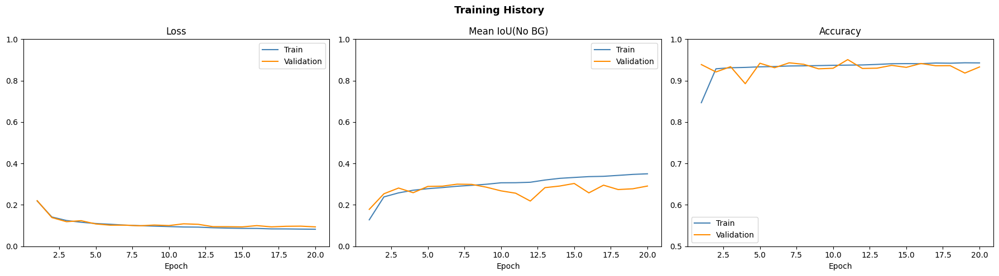

Saved : /content/unet/results/training_history_phase1.png


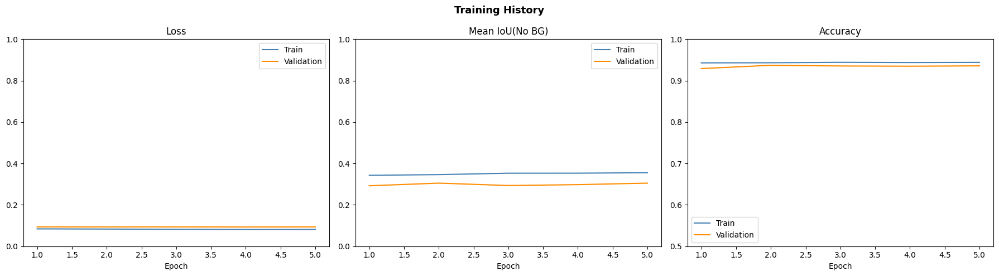

Saved : /content/unet/results/training_history_phase2.png


In [21]:
def plot_history(history, path, ylim_loss=(0, 1.0), ylim_iou=(0, 1.0), ylim_acc=(0.5, 1.0)):
    loss     = history.history["loss"]
    val_loss = history.history["val_loss"]
    iou      = history.history["mean_iou_no_bg"]
    val_iou  = history.history["val_mean_iou_no_bg"]
    acc      = history.history["accuracy"]
    val_acc  = history.history["val_accuracy"]

    epochs_total = range(1, len(loss) + 1)
    fig, axes    = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle("Training History", fontsize=13, fontweight="bold")

    for ax, tr, va, title, ylim in zip(
        axes,
        [loss,     iou,        acc],
        [val_loss, val_iou,    val_acc],
        ["Loss",   "Mean IoU(No BG)", "Accuracy"],
        [ylim_loss, ylim_iou,  ylim_acc]
    ):
        ax.plot(epochs_total, tr, label="Train",      color="steelblue")
        ax.plot(epochs_total, va, label="Validation", color="darkorange")
        ax.set_title(title)
        ax.set_xlabel("Epoch")
        ax.set_ylim(ylim)
        ax.legend()

    plt.tight_layout()
    plt.savefig(path, dpi=150)
    plt.show()
    print(f"Saved : {path}")


# Phase 1
path = os.path.join(RESULT_DIR, "training_history_phase1.png")
plot_history(history, path)

# Phase 2
if ft_history and len(ft_history.history["loss"]) > 0:
    path = os.path.join(RESULT_DIR, "training_history_phase2.png")
    plot_history(ft_history, path)
else:
    print("Phase 2 did not improve, skipping ft_history plot.")

# Test & Evaluation

In [22]:
# Load best model and evaluate
print("\n" + "="*60)
print("FINAL EVALUATION ON TEST SET")
print("="*60)

# Check model exists before load
if os.path.exists(ft_checkpoint_path):
    load_path = ft_checkpoint_path
    print("Loading Phase 2 model")
else:
    load_path = checkpoint_path
    print("Loading Phase 1 model")

best_model = tf.keras.models.load_model(
    load_path,
    custom_objects={
        "MeanIoUExcludeBackground": MeanIoUExcludeBackground,
        "total_loss": total_loss
    }
)

results = best_model.evaluate(test_dataset, verbose=1)
print(f"\n  Test Loss     : {results[0]:.4f}")
print(f"  Test Accuracy : {results[1]:.4f}")
print(f"  Test Mean IoU : {results[2]:.4f}")


FINAL EVALUATION ON TEST SET
Loading Phase 2 model
19/19 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.9360 - loss: 0.0974 - mean_iou_no_bg: 0.3086

  Test Loss     : 0.0955
  Test Accuracy : 0.9359
  Test Mean IoU : 0.3014


In [23]:
print("===== PER CLASS IoU =====")

all_preds = []
all_masks = []

for images, masks in test_dataset:
    preds = best_model.predict(images, verbose=0)
    preds = np.argmax(preds, axis=-1)
    masks = masks.numpy().squeeze(axis=-1)
    all_preds.append(preds)
    all_masks.append(masks)

all_preds = np.concatenate(all_preds, axis=0)
all_masks = np.concatenate(all_masks, axis=0)

def compute_iou(preds, masks, class_id):
    pred_c       = (preds == class_id)
    mask_c       = (masks == class_id)
    intersection = np.logical_and(pred_c, mask_c).sum()
    union        = np.logical_or(pred_c,  mask_c).sum()
    if union == 0:
        return float("nan")
    return intersection / union

print(f"\n  {'Class':<5} {'Name':<15} {'IoU':>8}  Status")
print(f"  {'-'*45}")

iou_scores = {}
for class_id, name in CLASS_NAMES.items():
    iou = compute_iou(all_preds, all_masks, class_id)
    iou_scores[name] = iou
    if np.isnan(iou):
        status = "NOT PRESENT"
    elif iou >= 0.7:
        status = "GOOD"
    elif iou >= 0.5:
        status = "ACCEPTABLE"
    else:
        status = "POOR"
    print(f"  {class_id:<5} {name:<15} {iou:>8.4f}  {status}")

valid_ious = [v for v in iou_scores.values() if not np.isnan(v)]
mean_iou   = np.mean(valid_ious)
print(f"\n  Mean IoU (mIoU) : {mean_iou:.4f}")

===== PER CLASS IoU =====

  Class Name                 IoU  Status
  ---------------------------------------------
  0     background        0.9532  GOOD
  1     grass_short       0.5193  ACCEPTABLE
  2     grass_medium      0.2105  POOR
  3     grass_long        0.1744  POOR

  Mean IoU (mIoU) : 0.4643


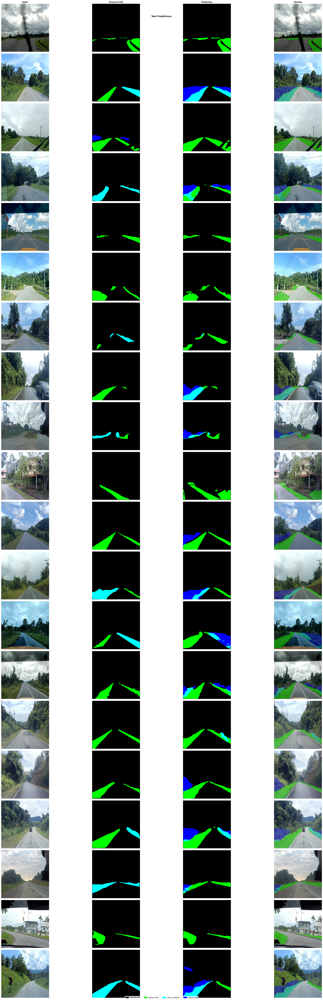

Saved : /content/unet/results/test_predictions.png


In [24]:
# Display test outputs
def show_predictions(dataset, model, n=20):
    fig, axes = plt.subplots(n, 4, figsize=(32, n * 4))
    fig.suptitle("Test Predictions", fontsize=13, fontweight="bold")

    for ax, title in zip(axes[0], ["Input", "Ground Truth", "Prediction", "Overlay"]):
        ax.set_title(title, fontsize=11, fontweight="bold")

    count = 0
    for images, masks in dataset:
        if count >= n:
            break
        preds = model.predict(images, verbose=0)
        preds = np.argmax(preds, axis=-1)

        for i in range(len(images)):
            if count >= n:
                break

            img       = images[i].numpy()
            gt_mask   = masks[i].numpy().squeeze()
            pred_mask = preds[i]

            # Ground truth RGB
            gt_rgb = np.zeros((*gt_mask.shape, 3), dtype=np.uint8)
            for cid, color in CLASS_COLORS.items():
                gt_rgb[gt_mask == cid] = color

            # Prediction RGB
            pred_rgb = np.zeros((*pred_mask.shape, 3), dtype=np.uint8)
            for cid, color in CLASS_COLORS.items():
                pred_rgb[pred_mask == cid] = color

            # Overlay on original image
            overlay = (img * 255).astype(np.uint8).copy()
            alpha   = 0.4
            for cid, color in CLASS_COLORS.items():
                if cid == 0:
                    continue
                region          = pred_mask == cid
                overlay[region] = (
                    overlay[region] * (1 - alpha) +
                    np.array(color) * alpha
                ).astype(np.uint8)

            axes[count][0].imshow(img);      axes[count][0].axis("off")
            axes[count][1].imshow(gt_rgb);   axes[count][1].axis("off")
            axes[count][2].imshow(pred_rgb); axes[count][2].axis("off")
            axes[count][3].imshow(overlay);  axes[count][3].axis("off")
            count += 1

    patches = [mpatches.Patch(color=np.array(c)/255, label=CLASS_NAMES[k])
               for k, c in CLASS_COLORS.items()]
    fig.legend(handles=patches, loc="lower center", ncol=4)
    plt.tight_layout()
    path = os.path.join(RESULT_DIR, "test_predictions.png")
    plt.savefig(path, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved : {path}")

show_predictions(test_dataset, best_model, n=20)

In [25]:
report = {
    "generated_at" : datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "model"        : "UNet with MobileNetV2 encoder",
    "config"       : {
        "img_size"   : list(IMG_SIZE),
        "num_classes": NUM_CLASSES,
        "batch_size" : BATCH_SIZE,
        "epochs"     : EPOCHS,
        "loss"       : "Combined CCE, Focal loss, Tversky loss",
        "optimizer"  : "Adam"
    },
    "dataset"      : {
        "train" : len(train_img_paths),
        "val"   : len(val_img_paths),
        "test"  : len(test_img_paths)
    },
    "test_results" : {
        "loss"     : round(float(results[0]), 4),
        "accuracy" : round(float(results[1]), 4),
        "mean_iou_no_bg" : round(float(mean_iou),   4)
    },
    "per_class_iou": {
        name: round(float(iou), 4) if not np.isnan(iou) else None
        for name, iou in iou_scores.items()
    }
}

report_path = os.path.join(RESULT_DIR, "evaluation_report.json")
with open(report_path, "w") as f:
    json.dump(report, f, indent=4)

print("\n" + "="*60)
print("SUMMARY REPORT")
print("="*60)
print(f"\n  Model    : {checkpoint_path}")
print(f"  Report   : {report_path}")
print(f"  Plots    : {RESULT_DIR}")
print(f"\n  Test Loss     : {results[0]:.4f}")
print(f"  Test Accuracy : {results[1]:.4f}")
print(f"  Test Mean IoU : {mean_iou:.4f}")
print(f"\n  Per Class IoU:")
for name, iou in iou_scores.items():
    if not np.isnan(iou):
        print(f"    {name:<15} : {iou:.4f}")


SUMMARY REPORT

  Model    : /content/unet/models/unet_1.keras
  Report   : /content/unet/results/evaluation_report.json
  Plots    : /content/unet/results

  Test Loss     : 0.0955
  Test Accuracy : 0.9359
  Test Mean IoU : 0.4643

  Per Class IoU:
    background      : 0.9532
    grass_short     : 0.5193
    grass_medium    : 0.2105
    grass_long      : 0.1744


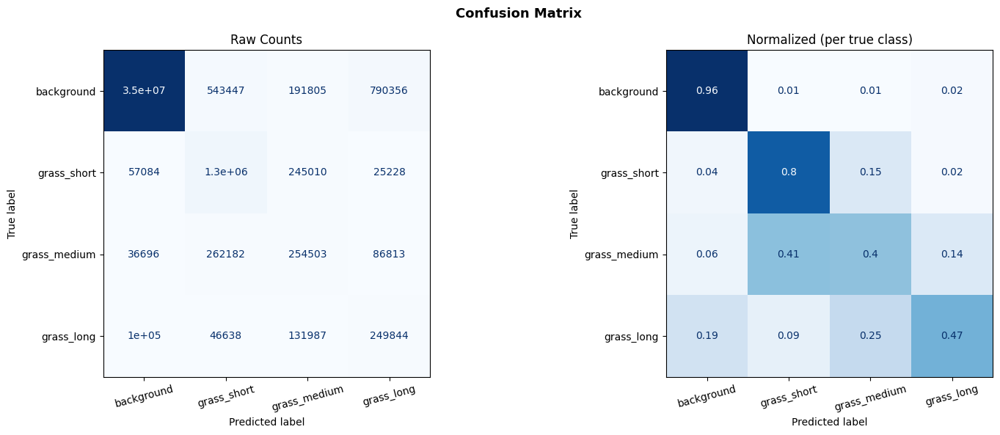

Saved : /content/unet/results/confusion_matrix.png


In [26]:
# Confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Flatten all predictions and masks
y_true_flat = all_masks.flatten()
y_pred_flat = all_preds.flatten()

# Compute confusion matrix
cm = confusion_matrix(y_true_flat, y_pred_flat, labels=[0, 1, 2, 3])

# Normalized version (shows % instead of raw counts)
cm_norm = cm.astype("float") / cm.sum(axis=1, keepdims=True)

# Plot both side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle("Confusion Matrix", fontsize=13, fontweight="bold")

class_labels = list(CLASS_NAMES.values())

# Raw counts
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(ax=axes[0], colorbar=False, cmap="Blues")
axes[0].set_title("Raw Counts")
axes[0].set_xticklabels(class_labels, rotation=15)

# Normalized
disp_norm = ConfusionMatrixDisplay(confusion_matrix=cm_norm.round(2), display_labels=class_labels)
disp_norm.plot(ax=axes[1], colorbar=False, cmap="Blues")
axes[1].set_title("Normalized (per true class)")
axes[1].set_xticklabels(class_labels, rotation=15)

plt.tight_layout()
path = os.path.join(RESULT_DIR, "confusion_matrix.png")
plt.savefig(path, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved : {path}")

In [27]:
import shutil
from google.colab import files

# Zip the folder
shutil.make_archive("/content/unet", 'zip', "/content/unet")

# Download
files.download("/content/unet.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>